# Data Analysis of the SILICONE data set

The idea of this notebook is to analyze the SILICONE database coming from the 'datasets' package. 

For that, I have previously imported the data set of train / test and validation in CSV to allow the faster execution of the notebook.

In [1]:
import pandas as pd 
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.offline as ofl
import plotly.graph_objects as go 
from wordcloud import WordCloud ,STOPWORDS
import numpy as np 
from datasets import load_dataset
from transformers import AutoTokenizer
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split
from function_analyse import (loading_data)

ofl.init_notebook_mode()

## We import our data set ! 

In [2]:
def loading_data(path_data):
    """
    This function will importe the CSV if they exist, else it will import the dataframe and tokenize them 
    
    Args:
        path_data (str): A path to load or download the data 

    Returns:
        pd.DataFrame : 3 dataframe (train,test,valid) initials without modification 
    """
    try : 
        train = pd.read_csv(f"{path_data}/train_initial.csv")
        test = pd.read_csv(f"{path_data}/test_initial.csv")
        valid = pd.read_csv(f"{path_data}/valid_initial.csv")
        return train,test,valid    
    except : 
        train = load_dataset("silicone", "dyda_da",split='train')
        test = load_dataset("silicone", "dyda_da",split='test')
        valid = load_dataset("silicone", "dyda_da",split='validation')
        tokenizer = AutoTokenizer.from_pretrained('bert-base-cased')    
        dataset_train  = train.map(lambda e: tokenizer(e['Utterance'], truncation=True, padding='max_length'), batched=True)
        dataset_test  = test.map(lambda e: tokenizer(e['Utterance'], truncation=True, padding='max_length'), batched=True)
        dataset_valid  = valid.map(lambda e: tokenizer(e['Utterance'], truncation=True, padding='max_length'), batched=True)
        train = dataset_train.to_pandas().rename(columns={'Utterance':'text','Dialogue_Act':'intent'})
        test = dataset_test.to_pandas().rename(columns={'Utterance':'text','Dialogue_Act':'intent'})
        valid = dataset_valid.to_pandas().rename(columns={'Utterance':'text','Dialogue_Act':'intent'})
        train.to_csv(f"{path_data}/train_initial.csv")
        test.to_csv(f"{path_data}/test_initial.csv")
        valid.to_csv(f"{path_data}/valid_initial.csv")
        return train,test,valid

In [3]:
#Put the path to load or download the data 
path = '/Users/theoalegretti/Desktop/data/'

train, test, valid = loading_data(path)

df = pd.concat([train,test,valid])

print(f'length of the train set  : {len(train)} -> {np.round((len(train)/len(df))*100,2)} %')
print(f'length of the test set  : {len(test)} -> {np.round((len(test)/len(df))*100,2)} %')
print(f'length of the valid set  : {len(valid)} -> {np.round((len(valid)/len(df))*100,2)} %')
print(f'length of the whole data set  : {len(df)}')

length of the train set  : 87170 -> 84.65 %
length of the test set  : 7740 -> 7.52 %
length of the valid set  : 8069 -> 7.84 %
length of the whole data set  : 102979


The cutting of the base is rather correct, we are on 85 % for the train set, 7.5 % for the test and the valid set. 

## Let's get a look on the intent class 

Our job is to set up an intent classifier. We will therefore look at the distribution of intent classes (informative, commissive, question and directives). It is important that the classes are balanced so that the model does not overlearn some classes and underlearn others. 

In [4]:
fig  = go.Figure(px.histogram(x=df["intent"],histnorm="percent"))
fig.update_layout(title_text="Histogram of the intent repartition on the whole dataset in %", title_x=0.5,)
ofl.iplot(fig)

We can see that the intent repartition is not balanced on the whole data set, we may need to work on this issue for the classification models.

In [5]:
fig = make_subplots(rows=1,cols=3,subplot_titles=("Train set", "Test set", "Valid set"))
fig.add_trace(go.Histogram(x=train["intent"],name='Train set',histnorm='percent'),row=1,col=1)
fig.add_trace(go.Histogram(x=test["intent"],name='Test set',histnorm='percent'),row=1,col=2)
fig.add_trace(go.Histogram(x=valid["intent"],name='Valid set',histnorm='percent'),row=1,col=3)
fig.update_layout(height=500, width=900, title_text="Histogram of the repartion of intent setence on the tree data set in %",showlegend=False,title_x=0.5)
ofl.iplot(fig)

Even on the tree split set, the intent setences looks to be unbalanced, it's very important to work on this issue before running our classifier.

We will see that we can do (i) undersampling : we will remove some sentence (row) to a good repartition in each set or 
                 we can do (ii) oversampling : we will artificialy add some sentence using SMOTE or GAN process 

The (ii) is better in theory because we keep a lot of information but, for NLP process, we can't affirm that the GAN or SMOTE process are very efficient, it could cause some overfitting if the oversampler is not tuned well. 

The (i) is the alternative theory but it requieres a lot of data to not fall in the trap of underfitting. 

## Zipp Law and Frequence of words on SILICONE

In [6]:
lens = train.text.str.len()
print(f"Average of lenght of sentence :  {np.round(lens.mean(),1)}, the standart error: {np.round(lens.std(),1)}, the max observed: {np.round(lens.max(),2)}")

Average of lenght of sentence :  60.0, the standart error: 49.7, the max observed: 1412


As we can see, the sentence seems to be very different on the lenght, the tokenizer will be very important on the understand of the text by our model. 

In [7]:
fig  = px.histogram(x=lens,title="Histogram of the frequence of each word and the rank in counts (Zips Law proxy) ")
fig.update_layout(title_x=0.5)
ofl.iplot(fig)

Our data set looks to follow a Zipp Law. Some Bayesian statistics could estimated the proxy of this Zipps law. We have some outliers with more that 400 lenght in one sentence. We may remove them. 

## The repartition of the most frequent work on our dataset

In [8]:
all_words = train['text'].str.split(expand=True).unstack().value_counts()
data = [go.Bar(
            x = all_words.index.values[2:50],
            y = all_words.values[2:50],
            marker= dict(colorscale='Jet',
                         color = all_words.values[2:100]
                        )
    )]

layout = go.Layout(
    title='Top 50 Word frequencies in the training dataset'
)

fig = go.Figure(data=data, layout=layout)
fig.update_layout(title_x=0.5)
ofl.iplot(fig)

## Per intent, we want to the most frequent word 

In [9]:
train.intent.unique()

array(['directive', 'commissive', 'question', 'inform'], dtype=object)

In [10]:
words_inform = train[train.intent == "inform"]['text'].str.split(expand=True).unstack().value_counts()
words_directive = train[train.intent == "directive"]['text'].str.split(expand=True).unstack().value_counts()
words_commissive = train[train.intent == "commissive"]['text'].str.split(expand=True).unstack().value_counts()
words_question = train[train.intent == "question"]['text'].str.split(expand=True).unstack().value_counts()


fig = make_subplots(cols=2,rows=2,subplot_titles=("Inform intent","Question intent","Commissive intent","Directive intent"),)

fig.add_trace(go.Bar(
            x = words_inform.index.values[2:50],
            y = words_inform.values[2:50],
            marker= dict(colorscale='Jet',
                         color = words_inform.values[2:100]
                        )
    ),row=1,col=1)

fig.add_trace(go.Bar(
            x = words_directive.index.values[2:50],
            y = words_directive.values[2:50],
            marker= dict(colorscale='Hot',
                         color = words_directive.values[2:100]
                        )
    ),row=1,col=2)
fig.add_trace(go.Bar(
            x = words_commissive.index.values[2:50],
            y = words_commissive.values[2:50],
            marker= dict(colorscale='Teal',
                         color = words_commissive.values[2:100]
                        )
    ),row=2,col=1)
fig.add_trace(go.Bar(
            x = words_question.index.values[2:50],
            y = words_question.values[2:50],
            marker= dict(colorscale='Fall',
                         color = words_question.values[2:100]
                        )
    ),row=2,col=2)

fig.update_layout(showlegend=False,title_x=0.5)
ofl.iplot(fig)

## Let map the work per intent 

(-0.5, 399.5, 199.5, -0.5)

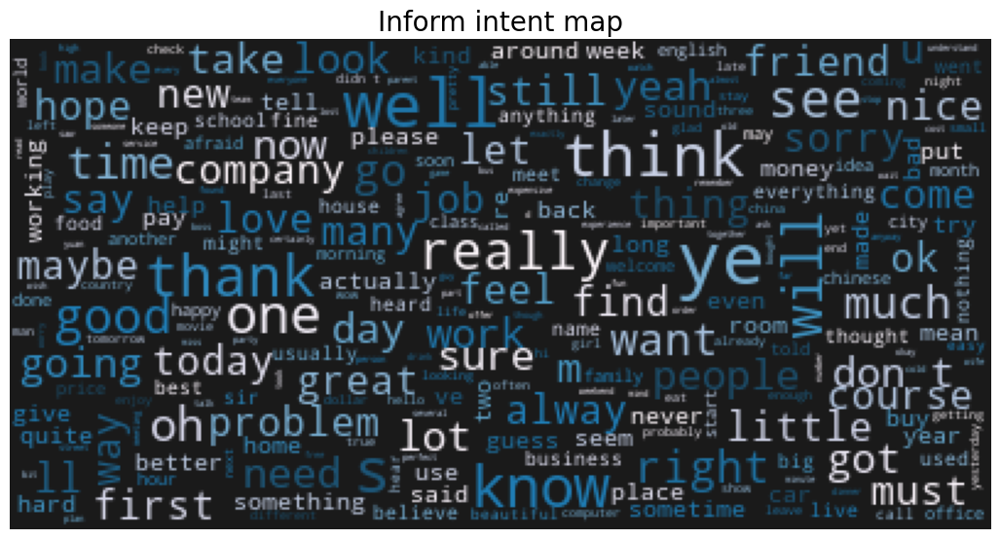

In [11]:
plt.figure(figsize=(13,9))
inform = train[train.intent=="inform"]["text"].values
wc = WordCloud(background_color="black", 
               max_words=1000, 
               stopwords=STOPWORDS, 
               max_font_size=30)
wc.generate(" ".join(inform))
plt.title("Inform intent map", fontsize=20)
plt.imshow(wc.recolor(colormap= 'PuBu' , random_state=17), alpha=0.9)
plt.axis('off')

(-0.5, 399.5, 199.5, -0.5)

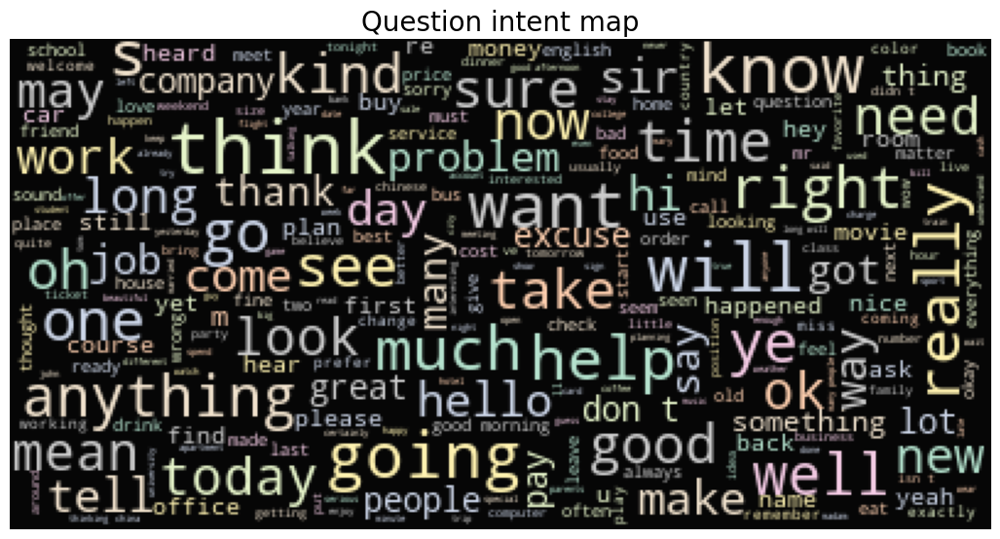

In [12]:
plt.figure(figsize=(13,9))


question = train[train.intent=="question"]["text"].values
wc = WordCloud(background_color="black", max_words=1000, 
            stopwords=STOPWORDS, max_font_size=30)


wc.generate(" ".join(question))
plt.title("Question intent map", fontsize=20)
# plt.imshow(wc.recolor( colormap= 'Pastel1_r' , random_state=17), alpha=0.98)
plt.imshow(wc.recolor( colormap= 'Pastel2' , random_state=17), alpha=0.98)
plt.axis('off')

# Now,let's rebalance the classes

### Doing some under sampling

In [13]:
min_occurrences = df['intent'].value_counts().min()

subsets = []
for classe in df['intent'].unique():
    subset = df[df['intent'] == classe].sample(min_occurrences)
    subsets.append(subset)

balanced_df = pd.concat(subsets)

In [14]:
train_under, test_under = train_test_split(balanced_df, test_size=0.15, stratify=balanced_df['intent'])
test_under, valid_under = train_test_split(test_under, test_size=0.5, stratify=test_under['intent'])


print(f'length of the train set  : {len(train_under)} -> {np.round((len(train_under)/len(balanced_df))*100,2)} %')
print(f'length of the test set  : {len(test_under)} -> {np.round((len(test_under)/len(balanced_df))*100,2)} %')
print(f'length of the valid set  : {len(valid_under)} -> {np.round((len(valid_under)/len(balanced_df))*100,2)} %')
lost_point = len(df) - len(balanced_df)
print(f'Numbers of lost points  : {lost_point} --> {np.round((-lost_point/len(df))*100,2)} %')

length of the train set  : 33061 -> 85.0 %
length of the test set  : 2917 -> 7.5 %
length of the valid set  : 2918 -> 7.5 %
Numbers of lost points  : 64083 --> -62.23 %


In [15]:
all_words = train_under['text'].str.split(expand=True).unstack().value_counts()
data = [go.Bar(
            x = all_words.index.values[2:50],
            y = all_words.values[2:50],
            marker= dict(colorscale='Jet',
                         color = all_words.values[2:100]
                        )
    )]

layout = go.Layout(
    title='Top 50 Word frequencies in the training dataset undersampled'
)

fig = go.Figure(data=data, layout=layout)
fig.update_layout(title_x=0.5)
ofl.iplot(fig)

In [16]:
fig = make_subplots(rows=1,cols=3,subplot_titles=("Train set undersampled", "Test set undersampled", "Valid set undersampled"))
fig.add_trace(go.Histogram(x=train_under["intent"],name='Train set undersampled',histnorm='percent'),row=1,col=1)
fig.add_trace(go.Histogram(x=test_under["intent"],name='Test set undersampled',histnorm='percent'),row=1,col=2)
fig.add_trace(go.Histogram(x=valid_under["intent"],name='Valid set undersampled',histnorm='percent'),row=1,col=3)
fig.update_layout(height=500, width=900, title_text="Histogram of the repartion of intent setence on the tree data set in % undersampled",showlegend=False,title_x=0.5)
ofl.iplot(fig)

## Augmentation data

SMOTE with NLP is not obvious, we will focus on the undersampling

In [11]:
import os
os.environ["MODEL_DIR"] = '../model'

In [16]:
import nlpaug.augmenter.word as naw
from nlpaug.util.file.download import DownloadUtil
# DownloadUtil.download_word2vec(dest_dir='.') # Download word2vec model
aug = naw.WordEmbsAug(
    model_type='word2vec', model_path='/GoogleNews-vectors-negative300.bin',
    action="insert")
augmented_text = aug.augment(df.text)
print("Original:")
print(df.text)
print("Augmented Text:")
print(augmented_text)

NameError: name 'KeyedVectors' is not defined